In [1]:
from collections import defaultdict
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import sklearn
# Use Jaccard distance from this package
# Recall Jaccard_dist(A,B) = 1-Jaccard_similarity(A, B) 
import scipy.spatial.distance as spdist

import ihop
from ihop.community2vec import GensimCommunity2Vec
import ihop.clustering as ic


In [2]:

DATA_ROOT = Path("../data")
C2V_ROOT = DATA_ROOT / "community2vec"
VIZ_PATH = DATA_ROOT / "community2vec_nearest_neighbor_visuals"

if not VIZ_PATH.exists():
    VIZ_PATH.mkdir()

MONTHS = sorted(["2021-04", "2021-05", "2021-06", "2021-07", "2021-08", "2021-09", "2021-10", "2021-11", "2021-12", "2022-01", "2022-02", "2022-03"
])

C2V_MODELS = [GensimCommunity2Vec.load(C2V_ROOT / f"RC_{m}"/"best_model") for m in MONTHS]

SUBREDDIT_COUNTS_CSVS = [C2V_ROOT / f"RC_{m}" / "subreddit_counts.csv" for m in MONTHS]

In [3]:
def get_jaccard_similarity(set1, set2):
    intersection_size = len(set1.intersection(set2))
    if intersection_size == 0: 
        return 0
    union_size = len(set1.union(set2))
    return intersection_size / union_size


# Basic Inter-month Set Metrics
Determine which subreddits appear in EVERY MONTH in the dataset.

In [4]:
year_union = set()
year_intersection = set(C2V_MODELS[0].get_index_to_key())
for month_model in C2V_MODELS:
    month_subreddits = set(month_model.get_index_to_key())
    year_union = month_subreddits.union(year_union)
    year_intersection = month_subreddits.intersection(year_intersection)
print("Size of union over all months:", len(year_union))
print("Size of intersection over all months:", len(year_intersection))

Size of union over all months: 15292
Size of intersection over all months: 6950


In [5]:
# Some examples of the subreddits which appear in every month
for i, s in enumerate(year_intersection):
    print(s)
    if i>10:break

Nerf
declutter
GrowingMarijuana
DunkinDonuts
cowboys
orthotropics
Teachers
FL_Studio
PantiesToTheSide
mintmobile
jerseyshore
woodworking


# Measure the overall trends of nearest neighbor change
We'd like to know on average how much a subreddit's nearest neighbors change from one month to the next. Here we will fix the number of nearest neighbors to examine, then examine how each subreddits' neighbors change in adjacent months using Jaccard Similarity 

In [6]:
k_nearest_neighbors = 20
jaccard_similarity_tracking_df = pd.DataFrame(data={"subreddit":list(year_intersection)})
jaccard_sim_cols = []
prev_month=None
for month, c2v_model in zip(MONTHS, C2V_MODELS):
    this_month_col = f"{month} {k_nearest_neighbors} nearest subreddits"
    jaccard_similarity_tracking_df[this_month_col] = jaccard_similarity_tracking_df["subreddit"].apply(lambda x: set(c2v_model.get_nearest_neighbors(x, topn=k_nearest_neighbors)))

    if prev_month is not None:
        prev_month_col = f"{prev_month} {k_nearest_neighbors} nearest subreddits"
        js_col_name = f"{month} vs {prev_month} Jaccard Similiarity"

        def js_with_specific_cols(row):
            return get_jaccard_similarity(
                row[this_month_col], 
                row[prev_month_col])

        jaccard_similarity_tracking_df[js_col_name] = jaccard_similarity_tracking_df.apply(js_with_specific_cols, axis=1)
        jaccard_sim_cols.append(js_col_name)

    prev_month=month

In [7]:
js_avg_col = "average Jaccard Similarity between adjacent months over the year"
js_stddev_col = "stddev Jaccard Similarity between adjacent months over the year"
jaccard_similarity_tracking_df[js_avg_col] = jaccard_similarity_tracking_df[jaccard_sim_cols].mean(axis=1)

jaccard_similarity_tracking_df[js_stddev_col] = jaccard_similarity_tracking_df[jaccard_sim_cols].std(axis=1)



In [8]:
jaccard_similarity_tracking_df = jaccard_similarity_tracking_df.sort_values(by=[js_avg_col])
jaccard_similarity_tracking_df

,subreddit,2021-04 20 nearest subreddits,2021-05 20 nearest subreddits,2021-05 vs 2021-04 Jaccard Similiarity,2021-06 20 nearest subreddits,2021-06 vs 2021-05 Jaccard Similiarity,2021-07 20 nearest subreddits,2021-07 vs 2021-06 Jaccard Similiarity,2021-08 20 nearest subreddits,2021-08 vs 2021-07 Jaccard Similiarity,...,2021-12 20 nearest subreddits,2021-12 vs 2021-11 Jaccard Similiarity,2022-01 20 nearest subreddits,2022-01 vs 2021-12 Jaccard Similiarity,2022-02 20 nearest subreddits,2022-02 vs 2022-01 Jaccard Similiarity,2022-03 20 nearest subreddits,2022-03 vs 2022-02 Jaccard Similiarity,average Jaccard Similarity between adjacent months over the year,stddev Jaccard Similarity between adjacent months over the year
3830,newsNepal,"{SpecialSnowflake, ClashOfClans, Memes_Of_The_...","{exmuslim, MBA, Epilepsy, dancegavindance, Ind...",0.00000,"{climbergirls, transpositive, WhatsWrongWithYo...",0.000000,"{Moissanite, Fedexers, mkd, yeezys, Slipknot, ...",0.000000,"{AskAnAmerican, LawFirm, BostonTerrier, immigr...",0.00000,...,"{E30, worldofgothic, deadcells, Osana, Polska_...",0.000000,"{Malazan, kadena, newtonco, BandMaid, cryptomi...",0.000000,"{subreddit_simulacrum, AZSwingers, ArizonaSwin...",0.000000,"{PowerTripMorningShow, bassnectar, ichbin40und...",0.000000,0.000000,0.000000
3526,OzBargainNew,"{whatisthiscar, Shitty_Car_Mods, spotted, Just...","{NewsOfTheStupid, IchikaOrimuraDefense, housto...",0.00000,"{cyprus, emergencymedicine, Spokane, CampingGe...",0.000000,"{Laylalennox18, TwitchGoneWild, aforismiecitaz...",0.000000,"{sonos, seriouseats, BlockedAndReported, HomeN...",0.00000,...,"{subreddit_simulacrum, WaifusLewd, FenerbahceS...",0.000000,"{SeenOnNews_longtail, Telegram_Nudes, whitepeo...",0.000000,"{Fallout76Marketplace, chinchilla, spiderbro, ...",0.000000,"{The_Mueller, houstonr4r, shitstop, VVV, harbo...",0.000000,0.000000,0.000000
2382,CelebbattlePolls,"{DanLeBatardShow, Fedexers, SuperMegaBaseball,...","{discord_irl, CODMobile_Loadouts, Jewdank, cod...",0.00000,"{deliveroos, optometry, Staples, google, Socia...",0.000000,"{eu4, Buttcoin, de, irishpolitics, Moronavirus...",0.000000,"{discord_irl, yiffinhell, holesome, SocietyLou...",0.00000,...,"{marvelstudios, StreetFighter, gibson, RaceTra...",0.000000,"{violinist, TeslaModel3Delivery, TeslaModel3, ...",0.000000,"{crashbandicoot, arcticmonkeys, PrimeiraLiga, ...",0.000000,"{raisedbywolves, AnimeHate, backpain, ShermanP...",0.000000,0.000000,0.000000
3566,SubSimulatorGPT2,"{YahooQR, desnudas, Cult_of_Lex_Nuqui, suit_cl...","{AdmiralBulldog, Hyundai, redbubble, RushRoyal...",0.00000,"{actuary, Libertarian, FulfillmentByAmazon, SC...",0.000000,"{cromunity, 40kscience, serginhes, hogwartswer...",0.000000,"{TeenagersITA, fnatic, internacional, SchumyVK...",0.00000,...,"{cromunity, IXFIworld, Nonakanal, ExAndClosetA...",0.000000,"{StandUpComedy, kulchasimulator, DetroitRedWin...",0.000000,"{DebateAChristian, cubancigars, mississippi, a...",0.000000,"{HogwartsWerewolves, TcgCoin, BoardKingsTradin...",0.000000,0.000000,0.000000
3279,viral,"{belenegri, Toys_Best_Deals, antimatterindustr...","{IchikaOrimuraDefense, SugarBabyGroup, houston...",0.00000,"{vinylscharts, YouTubeGamers, Cult_of_Lex_Nuqu...",0.000000,"{OPBR, DanLeBatardShow, TeslaModel3Delivery, M...",0.000000,"{asssophat, Mommy_tits, The_ASSylum, hotclub, ...",0.00000,...,"{soundboardpranks, Vive, Stadia, AskLGBT, Enby...",0.000000,"{bdsm, AdeptusMechanicus, darkestdungeon, SS13...",0.000000,"{carscirclejerk, Mechwarrior5, robotics, Space...",0.000000,"{SeenOnNews_longtail, neonewstoday, OzBargainN...",0.000000,0.002331,0.007731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,readwithme,"{TheGamerLounge, RedditMasterClasses, BlackMed...","{TheGamerLounge, RedditMasterClasses, BlackMed...",0.73913,"{TheGamerLounge, RedditMasterClasses, KrunkerI...",0.904762,"{TheGamerLounge, RedditMasterClasses, BlackMed...",0.818182,"{TheGamerLounge, RedditMasterClasses, BlackMed..

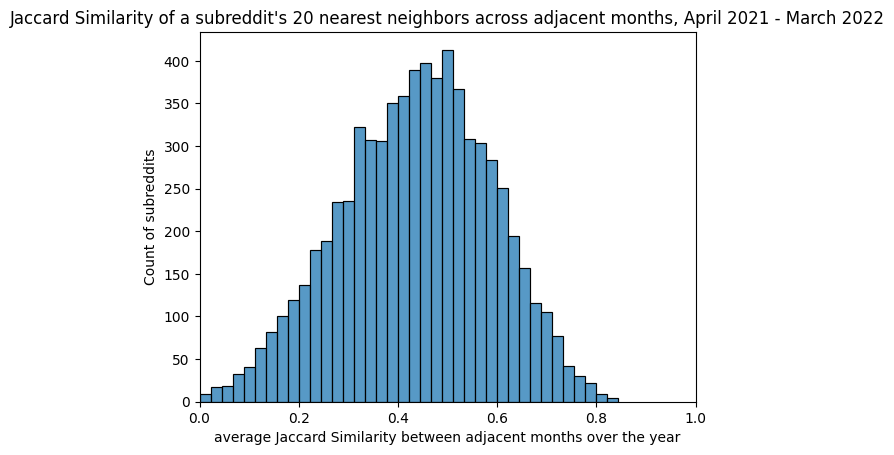

<Figure size 640x480 with 0 Axes>

In [9]:
ax = sns.histplot(data=jaccard_similarity_tracking_df, x=js_avg_col)
ax.set(ylabel="Count of subreddits", title = f"Jaccard Similarity of a subreddit's {k_nearest_neighbors} nearest neighbors across adjacent months, April 2021 - March 2022")
plt.xlim(0, 1)
plt.show()
plt.clf()

In [10]:
# Which are the LEAST stable subreddits in terms of nearest neighbors? 
subreddits_with_lowest_avg_js = jaccard_similarity_tracking_df.head(int(0.1 * len(year_intersection)))
print("Subreddits with lowest avg. Jaccard Similarity:", list(subreddits_with_lowest_avg_js["subreddit"][:50]))
display(subreddits_with_lowest_avg_js)

Subreddits with lowest avg. Jaccard Similarity: ['newsNepal', 'OzBargainNew', 'CelebbattlePolls', 'SubSimulatorGPT2', 'viral', 'EmpiresAndPuzzles', 'NYr4r', 'BaltimoreAndDCr4r', 'sherwinwilliams', 'RiseofKingdoms', 'SexDolls', 'GolfClash', 'chicagor4r', 'SubredditSummaryBot', 'hookah', 'HeroWarsApp', 'BrasilSimulator', 'test', 'ShadowBan', 'GBr4r', 'OrnaRPG', 'ShoppingDealsOnline', 'PickOne', '8BallPool', 'redditrequest', 'lordsmobile', 'HaveWeMet', 'adultsnew', 'kickopenthedoor', 'Fencing', 'Twitter', 'DiscordAdvertising', 'tappedout', 'facebook', 'QuikTrip', 'playingcards', 'ACL', 'gofundme', 'battlebots', 'randomdice', 'Archero', 'McDonaldsEmployees', 'McLounge', 'worldpolitics', 'SimsMobile', 'BABYMETAL', 'DollarGeneral', 'Blind', 'ModSupport', 'beingaDIK']


,subreddit,2021-04 20 nearest subreddits,2021-05 20 nearest subreddits,2021-05 vs 2021-04 Jaccard Similiarity,2021-06 20 nearest subreddits,2021-06 vs 2021-05 Jaccard Similiarity,2021-07 20 nearest subreddits,2021-07 vs 2021-06 Jaccard Similiarity,2021-08 20 nearest subreddits,2021-08 vs 2021-07 Jaccard Similiarity,...,2021-12 20 nearest subreddits,2021-12 vs 2021-11 Jaccard Similiarity,2022-01 20 nearest subreddits,2022-01 vs 2021-12 Jaccard Similiarity,2022-02 20 nearest subreddits,2022-02 vs 2022-01 Jaccard Similiarity,2022-03 20 nearest subreddits,2022-03 vs 2022-02 Jaccard Similiarity,average Jaccard Similarity between adjacent months over the year,stddev Jaccard Similarity between adjacent months over the year
3830,newsNepal,"{SpecialSnowflake, ClashOfClans, Memes_Of_The_...","{exmuslim, MBA, Epilepsy, dancegavindance, Ind...",0.000000,"{climbergirls, transpositive, WhatsWrongWithYo...",0.000000,"{Moissanite, Fedexers, mkd, yeezys, Slipknot, ...",0.000000,"{AskAnAmerican, LawFirm, BostonTerrier, immigr...",0.000000,...,"{E30, worldofgothic, deadcells, Osana, Polska_...",0.000000,"{Malazan, kadena, newtonco, BandMaid, cryptomi...",0.000000,"{subreddit_simulacrum, AZSwingers, ArizonaSwin...",0.000000,"{PowerTripMorningShow, bassnectar, ichbin40und...",0.000000,0.000000,0.000000
3526,OzBargainNew,"{whatisthiscar, Shitty_Car_Mods, spotted, Just...","{NewsOfTheStupid, IchikaOrimuraDefense, housto...",0.000000,"{cyprus, emergencymedicine, Spokane, CampingGe...",0.000000,"{Laylalennox18, TwitchGoneWild, aforismiecitaz...",0.000000,"{sonos, seriouseats, BlockedAndReported, HomeN...",0.000000,...,"{subreddit_simulacrum, WaifusLewd, FenerbahceS...",0.000000,"{SeenOnNews_longtail, Telegram_Nudes, whitepeo...",0.000000,"{Fallout76Marketplace, chinchilla, spiderbro, ...",0.000000,"{The_Mueller, houstonr4r, shitstop, VVV, harbo...",0.000000,0.000000,0.000000
2382,CelebbattlePolls,"{DanLeBatardShow, Fedexers, SuperMegaBaseball,...","{discord_irl, CODMobile_Loadouts, Jewdank, cod...",0.000000,"{deliveroos, optometry, Staples, google, Socia...",0.000000,"{eu4, Buttcoin, de, irishpolitics, Moronavirus...",0.000000,"{discord_irl, yiffinhell, holesome, SocietyLou...",0.000000,...,"{marvelstudios, StreetFighter, gibson, RaceTra...",0.000000,"{violinist, TeslaModel3Delivery, TeslaModel3, ...",0.000000,"{crashbandicoot, arcticmonkeys, PrimeiraLiga, ...",0.000000,"{raisedbywolves, AnimeHate, backpain, ShermanP...",0.000000,0.000000,0.000000
3566,SubSimulatorGPT2,"{YahooQR, desnudas, Cult_of_Lex_Nuqui, suit_cl...","{AdmiralBulldog, Hyundai, redbubble, RushRoyal...",0.000000,"{actuary, Libertarian, FulfillmentByAmazon, SC...",0.000000,"{cromunity, 40kscience, serginhes, hogwartswer...",0.000000,"{TeenagersITA, fnatic, internacional, SchumyVK...",0.000000,...,"{cromunity, IXFIworld, Nonakanal, ExAndClosetA...",0.000000,"{StandUpComedy, kulchasimulator, DetroitRedWin...",0.000000,"{DebateAChristian, cubancigars, mississippi, a...",0.000000,"{HogwartsWerewolves, TcgCoin, BoardKingsTradin...",0.000000,0.000000,0.000000
3279,viral,"{belenegri, Toys_Best_Deals, antimatterindustr...","{IchikaOrimuraDefense, SugarBabyGroup, houston...",0.000000,"{vinylscharts, YouTubeGamers, Cult_of_Lex_Nuqu...",0.000000,"{OPBR, DanLeBatardShow, TeslaModel3Delivery, M...",0.000000,"{asssophat, Mommy_tits, The_ASSylum, hotclub, ...",0.000000,...,"{soundboardpranks, Vive, Stadia, AskLGBT, Enby...",0.000000,"{bdsm, AdeptusMechanicus, darkestdungeon, SS13...",0.000000,"{carscirclejerk, Mechwarrior5, robotics, Space...",0.000000,"{SeenOnNews_longtail, neonewstoday, OzBargainN...",0.000000,0.002331,0.007731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2127,Dexter,"{lucifer, shameless, buffy, Modern_Family, mad...","{IASIP, shameless, Modern_Family, criminalmind...",0.250000,"{FearTheWalkingDead, lost, Supernatural, Prett...",0.250000,"{shameless, madmen, lost, Supernatural, Pretty...",0.290323,"{Modern_Family, lost, Supernatural, Gilm

In [11]:
# Which are the MOST stable subreddits in terms of nearest neighbors? 
subreddits_with_top_avg_js = jaccard_similarity_tracking_df.tail(int(0.1 * len(year_intersection)))
top_avg_js_subreddits = list(subreddits_with_top_avg_js["subreddit"])
top_avg_js_subreddits.reverse()
print("Subreddits with highest avg. Jaccard Similarity:", top_avg_js_subreddits[:50])
display(subreddits_with_top_avg_js)

Subreddits with highest avg. Jaccard Similarity: ['TheGamerLounge', 'TheYouShow', 'TheArtistStudio', 'RedditSessions', 'readwithme', 'gnome', 'distantsocializing', 'kde', 'MushroomGrowers', 'shrooms', 'RedditInTheKitchen', 'DnD', 'shroomers', 'PsilocybinMushrooms', 'MtF', 'Transgender_Surgeries', 'linuxquestions', 'fiaustralia', 'DnDHomebrew', 'AusFinance', 'AustralianPolitics', 'RedditSets', 'unixporn', 'auslaw', 'RedditMasterClasses', 'sydney', 'perth', 'canberra', 'australia', 'pan', 'brisbane', 'talentShow', 'whereintheworld', 'dndnext', 'onlyfanshottest', 'unclebens', 'California', 'Guitar', 'DrWillPowers', 'linux4noobs', 'DMAcademy', 'ManjaroLinux', 'Sneakers', 'VerifiedFeet', 'UnearthedArcana', 'linuxmasterrace', 'Onlyfans_Promo', 'photography', 'Dabs', 'FeetInYourFace']


,subreddit,2021-04 20 nearest subreddits,2021-05 20 nearest subreddits,2021-05 vs 2021-04 Jaccard Similiarity,2021-06 20 nearest subreddits,2021-06 vs 2021-05 Jaccard Similiarity,2021-07 20 nearest subreddits,2021-07 vs 2021-06 Jaccard Similiarity,2021-08 20 nearest subreddits,2021-08 vs 2021-07 Jaccard Similiarity,...,2021-12 20 nearest subreddits,2021-12 vs 2021-11 Jaccard Similiarity,2022-01 20 nearest subreddits,2022-01 vs 2021-12 Jaccard Similiarity,2022-02 20 nearest subreddits,2022-02 vs 2022-01 Jaccard Similiarity,2022-03 20 nearest subreddits,2022-03 vs 2022-02 Jaccard Similiarity,average Jaccard Similarity between adjacent months over the year,stddev Jaccard Similarity between adjacent months over the year
4389,Shamanism,"{witchcraft, tarot, pagan, AstralProjection, B...","{witchcraft, Ayahuasca, pagan, AstralProjectio...",0.600000,"{witchcraft, tarot, Ayahuasca, pagan, AstralPr...",0.600000,"{witchcraft, tarot, pagan, AstralProjection, J...",0.666667,"{witchcraft, Ayahuasca, pagan, AstralProjectio...",0.538462,...,"{tarot, pagan, AstralProjection, Jung, magick,...",0.600000,"{witchcraft, Ayahuasca, tarot, AstralProjectio...",0.538462,"{witchcraft, Ayahuasca, tarot, AstralProjectio...",0.666667,"{witchcraft, Ayahuasca, tarot, AstralProjectio...",0.818182,0.628702,0.096360
5750,ParlerWatch,"{forwardsfromgrandma, The_Mueller, Qult_Headqu...","{The_Mueller, Qult_Headquarters, politics, ins...",0.818182,"{forwardsfromgrandma, Qult_Headquarters, behin...",0.600000,"{forwardsfromgrandma, The_Mueller, Qult_Headqu...",0.481481,"{The_Mueller, HermanCainAward, Qult_Headquarte...",0.538462,...,"{HermanCainAward, amibeingdetained, The_Muelle...",0.600000,"{forwardsfromgrandma, HermanCainAward, Qult_He...",0.600000,"{forwardsfromgrandma, Qult_Headquarters, insan...",0.600000,"{HermanCainAward, Qult_Headquarters, politics,...",0.538462,0.629229,0.101482
6212,phinvest,"{Tomasino, beautytalkph, exIglesiaNiCristo, pe...","{dlsu, PHbuildapc, beautytalkph, peyups, exIgl...",0.428571,"{dlsu, beautytalkph, peyups, phcareers, Casual...",0.481481,"{Cebu, Tagalog, MentalHealthPH, beautytalkph, ...",0.428571,"{Cebu, Tagalog, PanganaySupportGroup, dlsu, Me...",0.739130,...,"{PanganaySupportGroup, beautytalkph, peyups, e...",0.666667,"{Cebu, PanganaySupportGroup, beautytalkph, pey...",0.666667,"{Cebu, Tagalog, beautytalkph, PHbuildapc, peyu...",0.600000,"{Cebu, Tagalog, beautytalkph, PHbuildapc, peyu...",0.904762,0.629241,0.144342
1146,travisscott,"{YoungThug, playboicarti, KidCudi, liluzivert,...","{YoungThug, playboicarti, KidCudi, liluzivert,...",0.600000,"{YoungThug, playboicarti, KidCudi, liluzivert,...",0.600000,"{YoungThug, playboicarti, KidCudi, yeezys, lil...",0.666667,"{YoungThug, playboicarti, KidCudi, liluzivert,...",0.818182,...,"{YoungThug, playboicarti, KidCudi, liluzivert,...",0.538462,"{YoungThug, playboicarti, KidCudi, liluzivert,...",0.538462,"{YoungThug, playboicarti, KidCudi, yeat_, lilu...",0.739130,"{YoungThug, DenzelCurry, playboicarti, KidCudi...",0.739130,0.629695,0.105316
1216,TeslaLounge,"{leaf, TeslaModel3, SpaceXLounge, elonmusk, BM...","{leaf, TeslaModel3, elonmusk, solar, Nest, ele...",0.600000,"{leaf, TeslaModel3Delivery, TeslaModel3, elonm...",0.666667,"{leaf, TeslaModel3Delivery, TeslaModel3, elonm...",0.739130,"{leaf, TeslaModel3Delivery, TeslaModel3, elonm...",0.818182,...,"{sonos, TeslaModel3Delivery, TeslaModel3, elon...",0.538462,"{leaf, TeslaModel3Delivery, TeslaModel3, elonm...",0.600000,"{TeslaModel3Delivery, TeslaModel3, SpaceXLoung...",0.428571,"{TeslaModel3Delivery, TeslaModel3, elonmusk, s...",0.538462,0.629952,0.105750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,readwithme,"{TheGamerLounge, RedditMasterClasses, BlackMed...","{TheGamerLounge, RedditMasterClasses, BlackMed...",0.739130,"{TheGamerLounge, RedditMasterClasses, KrunkerI...",0.904762,"{TheGamerLounge, RedditMasterClasses, BlackMed...",0.818182,"{TheGamerLounge, RedditMasterClasses, BlackMe

In [12]:
# How does this relate to a subreddit's popularity? 
subreddit_counts_list = [pd.read_csv(counts_csv, header=0) for counts_csv in SUBREDDIT_COUNTS_CSVS]
subreddit_counts_df = pd.concat(subreddit_counts_list)

# Aggregate to get yearly counts 
subreddit_counts_df = subreddit_counts_df.groupby(by="subreddit").sum().reset_index()
subreddit_counts_df = subreddit_counts_df.rename(columns={"count":"total comments in year"})
subreddit_counts_df = subreddit_counts_df.sort_values(by="total comments in year", ascending=False)
display(subreddit_counts_df)


,subreddit,total comments in year
760,AskReddit,79689598
3285,FreeKarma4U,27363700
14457,teenagers,25144477
12596,memes,22110807
2107,CryptoCurrency,19863824
...,...,...
8036,TaliyahMains,1762
10606,dbdLFG,1761
1047,BaseBuildingGames,1757
14070,slowpitch,1755


In [13]:
js_tracking_with_counts_df = pd.merge(jaccard_similarity_tracking_df, subreddit_counts_df, on="subreddit", how="left")
print(js_tracking_with_counts_df.shape)
display(js_tracking_with_counts_df)

(6950, 27)


,subreddit,2021-04 20 nearest subreddits,2021-05 20 nearest subreddits,2021-05 vs 2021-04 Jaccard Similiarity,2021-06 20 nearest subreddits,2021-06 vs 2021-05 Jaccard Similiarity,2021-07 20 nearest subreddits,2021-07 vs 2021-06 Jaccard Similiarity,2021-08 20 nearest subreddits,2021-08 vs 2021-07 Jaccard Similiarity,...,2021-12 vs 2021-11 Jaccard Similiarity,2022-01 20 nearest subreddits,2022-01 vs 2021-12 Jaccard Similiarity,2022-02 20 nearest subreddits,2022-02 vs 2022-01 Jaccard Similiarity,2022-03 20 nearest subreddits,2022-03 vs 2022-02 Jaccard Similiarity,average Jaccard Similarity between adjacent months over the year,stddev Jaccard Similarity between adjacent months over the year,total comments in year
0,newsNepal,"{SpecialSnowflake, ClashOfClans, Memes_Of_The_...","{exmuslim, MBA, Epilepsy, dancegavindance, Ind...",0.00000,"{climbergirls, transpositive, WhatsWrongWithYo...",0.000000,"{Moissanite, Fedexers, mkd, yeezys, Slipknot, ...",0.000000,"{AskAnAmerican, LawFirm, BostonTerrier, immigr...",0.00000,...,0.000000,"{Malazan, kadena, newtonco, BandMaid, cryptomi...",0.000000,"{subreddit_simulacrum, AZSwingers, ArizonaSwin...",0.000000,"{PowerTripMorningShow, bassnectar, ichbin40und...",0.000000,0.000000,0.000000,178769
1,OzBargainNew,"{whatisthiscar, Shitty_Car_Mods, spotted, Just...","{NewsOfTheStupid, IchikaOrimuraDefense, housto...",0.00000,"{cyprus, emergencymedicine, Spokane, CampingGe...",0.000000,"{Laylalennox18, TwitchGoneWild, aforismiecitaz...",0.000000,"{sonos, seriouseats, BlockedAndReported, HomeN...",0.00000,...,0.000000,"{SeenOnNews_longtail, Telegram_Nudes, whitepeo...",0.000000,"{Fallout76Marketplace, chinchilla, spiderbro, ...",0.000000,"{The_Mueller, houstonr4r, shitstop, VVV, harbo...",0.000000,0.000000,0.000000,46204
2,CelebbattlePolls,"{DanLeBatardShow, Fedexers, SuperMegaBaseball,...","{discord_irl, CODMobile_Loadouts, Jewdank, cod...",0.00000,"{deliveroos, optometry, Staples, google, Socia...",0.000000,"{eu4, Buttcoin, de, irishpolitics, Moronavirus...",0.000000,"{discord_irl, yiffinhell, holesome, SocietyLou...",0.00000,...,0.000000,"{violinist, TeslaModel3Delivery, TeslaModel3, ...",0.000000,"{crashbandicoot, arcticmonkeys, PrimeiraLiga, ...",0.000000,"{raisedbywolves, AnimeHate, backpain, ShermanP...",0.000000,0.000000,0.000000,29561
3,SubSimulatorGPT2,"{YahooQR, desnudas, Cult_of_Lex_Nuqui, suit_cl...","{AdmiralBulldog, Hyundai, redbubble, RushRoyal...",0.00000,"{actuary, Libertarian, FulfillmentByAmazon, SC...",0.000000,"{cromunity, 40kscience, serginhes, hogwartswer...",0.000000,"{TeenagersITA, fnatic, internacional, SchumyVK...",0.00000,...,0.000000,"{StandUpComedy, kulchasimulator, DetroitRedWin...",0.000000,"{DebateAChristian, cubancigars, mississippi, a...",0.000000,"{HogwartsWerewolves, TcgCoin, BoardKingsTradin...",0.000000,0.000000,0.000000,505949
4,viral,"{belenegri, Toys_Best_Deals, antimatterindustr...","{IchikaOrimuraDefense, SugarBabyGroup, houston...",0.00000,"{vinylscharts, YouTubeGamers, Cult_of_Lex_Nuqu...",0.000000,"{OPBR, DanLeBatardShow, TeslaModel3Delivery, M...",0.000000,"{asssophat, Mommy_tits, The_ASSylum, hotclub, ...",0.00000,...,0.000000,"{bdsm, AdeptusMechanicus, darkestdungeon, SS13...",0.000000,"{carscirclejerk, Mechwarrior5, robotics, Space...",0.000000,"{SeenOnNews_longtail, neonewstoday, OzBargainN...",0.000000,0.002331,0.007731,43847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6945,readwithme,"{TheGamerLounge, RedditMasterClasses, BlackMed...","{TheGamerLounge, RedditMasterClasses, BlackMed...",0.73913,"{TheGamerLounge, RedditMasterClasses, KrunkerI...",0.904762,"{TheGamerLounge, RedditMasterClasses, BlackMed...",0.818182,"{TheGamerLounge, RedditMasterClasses, BlackMed...",0.73913,...,0.666667,"{TheGamerLounge, RedditMasterClasses, Headline...",0.739130,"{TheGamerLounge, RedditMasterClasses, Headline...",0.904762,"{TheGamerLounge, RedditMasterClasses, Headline...",1.000000,0.815803,0.101704,103607
6946,RedditSessio

In [16]:
fig = px.scatter(js_tracking_with_counts_df, x=js_avg_col, y="total comments in year", hover_data=["subreddit"])
fig.show()

# Nearest Neighbors of Subreddits over time 

In order to build the community2vec models, we kept the top 10K subreddits in each month by number of comments posted. In the community2vec model of a given month, you can retrieve the set of any number of nearest neighbors for a particular subreddit, then compare how that set changes from one month to the next. The change in sets of nearest neighbors can be measured using the [Jaccard Index](https://en.wikipedia.org/wiki/Jaccard_index) of the top subreddits between each month. Let $S_1$ and $S_2$ be the top 10K subreddits for months 1 and 2 respectively, then the similarity and diversity of top subreddits between those months is $\frac{|S_1 \cap S_2|}{|S_1 \cup S_2|}$.
The closer to 1 the values are, the more similar the nearest neighbors are between those two months. 

10 nearest neightbors of r/trans


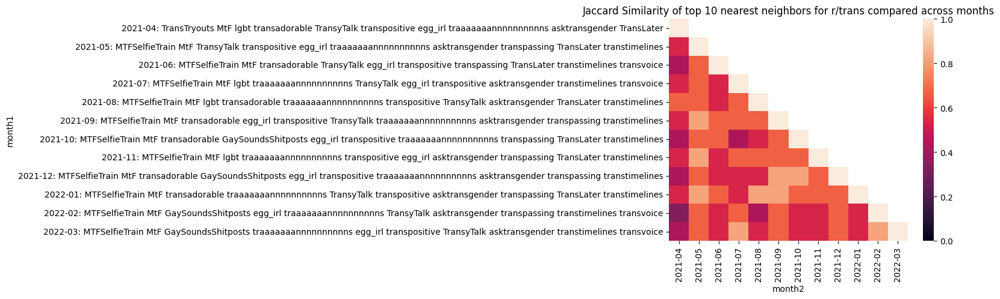

10 nearest neightbors of r/antiwork


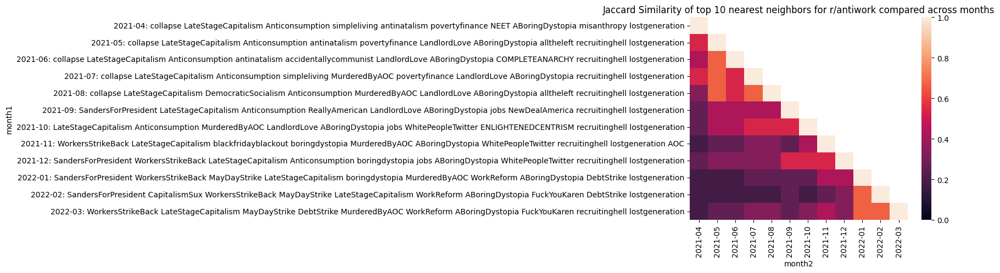

10 nearest neightbors of r/WorkReform


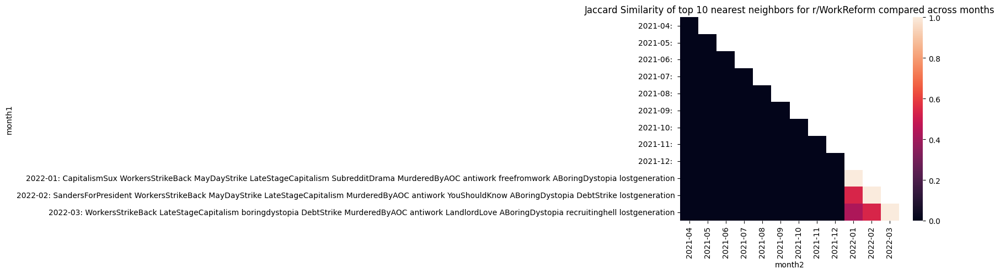

10 nearest neightbors of r/AskReddit


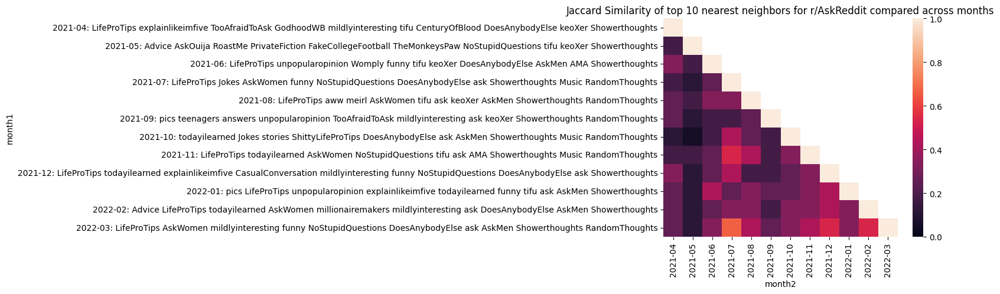

10 nearest neightbors of r/IdiotsInCars


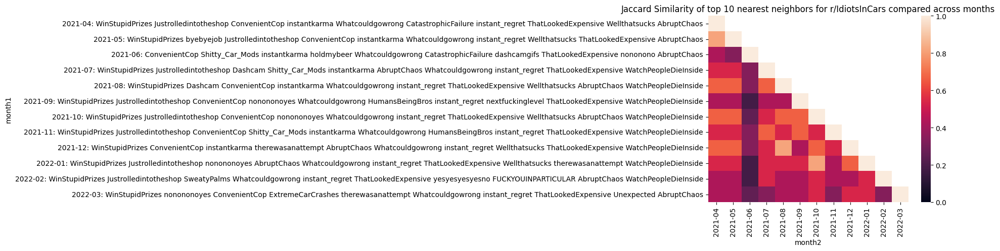

10 nearest neightbors of r/wallstreetbets


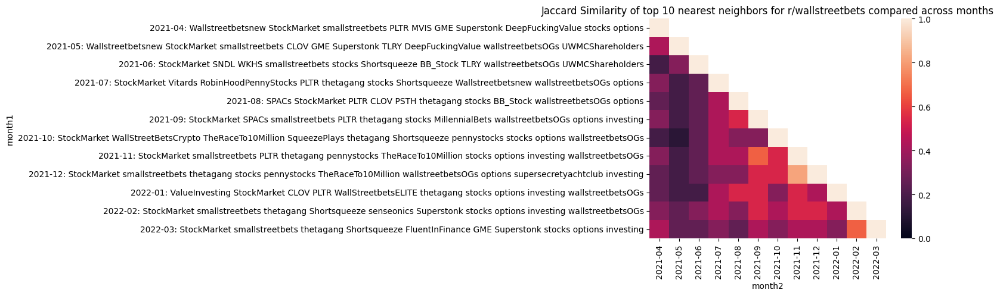

10 nearest neightbors of r/vaxxhappened


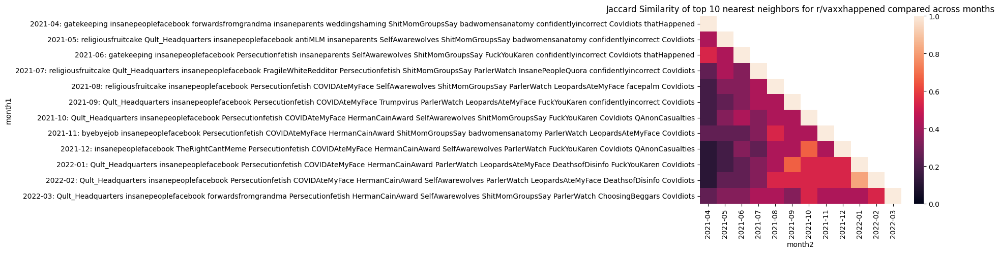

10 nearest neightbors of r/PublicFreakout


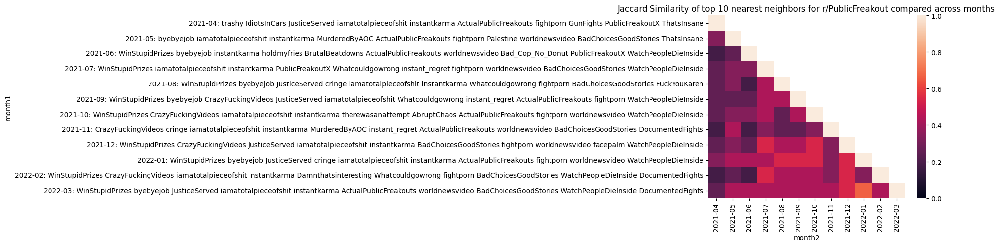

10 nearest neightbors of r/ActualPublicFreakouts


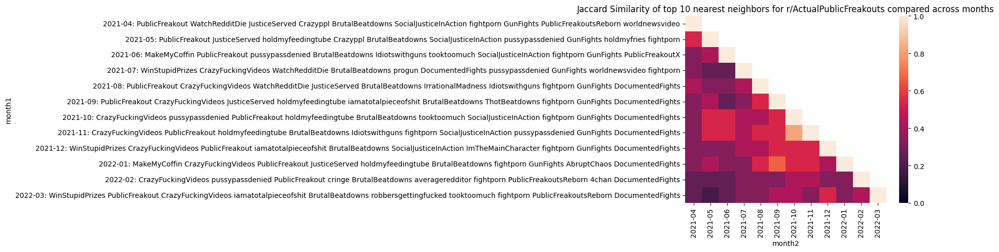

10 nearest neightbors of r/TheRedPill


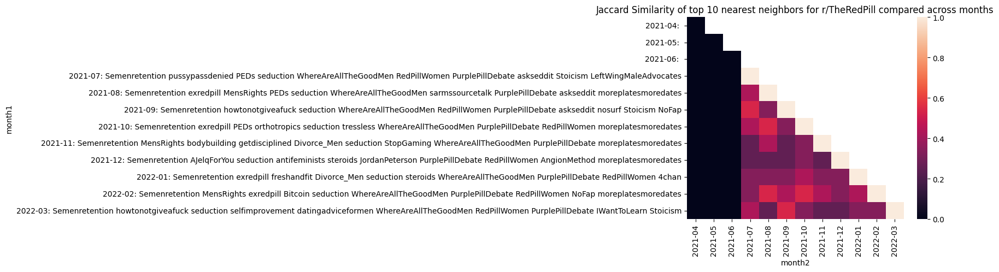

10 nearest neightbors of r/dating_advice


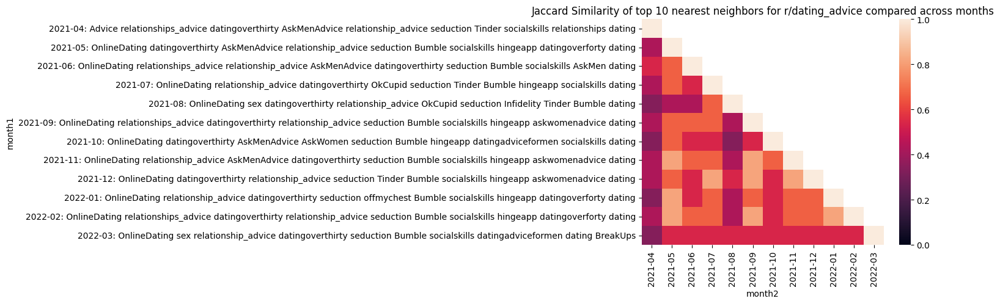

10 nearest neightbors of r/democrats


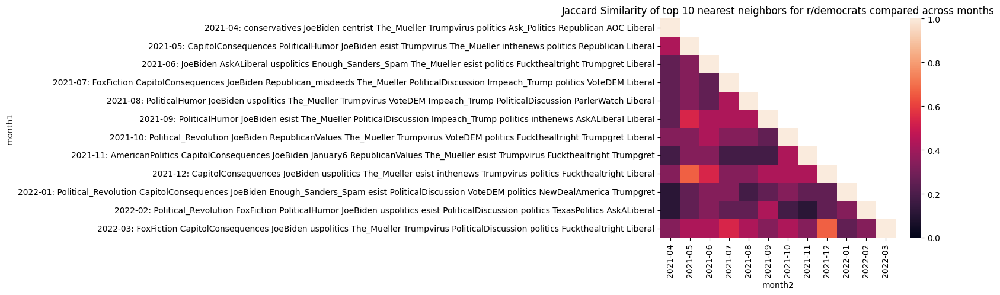

10 nearest neightbors of r/Conservative


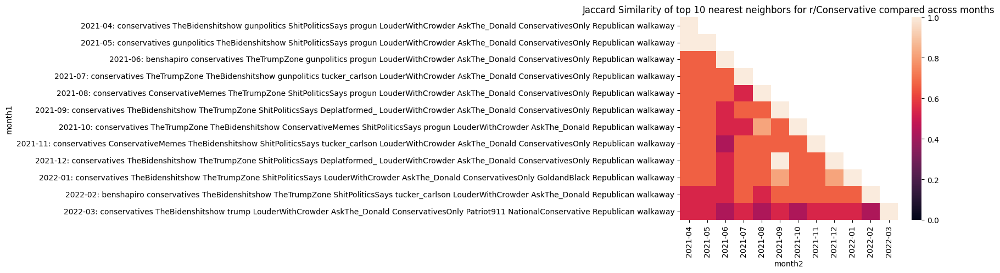

10 nearest neightbors of r/conservatives


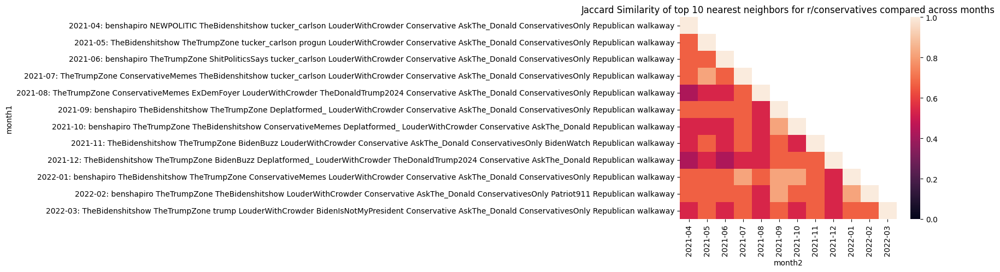

10 nearest neightbors of r/AskThe_Donald


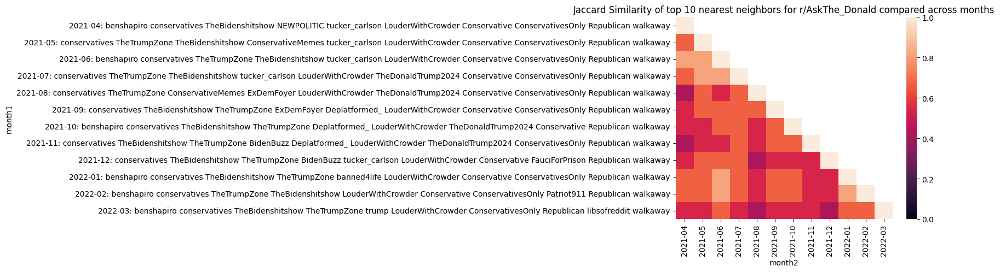

10 nearest neightbors of r/running


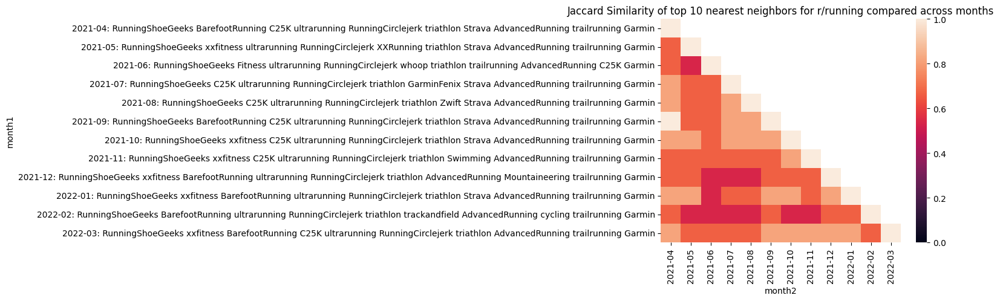

10 nearest neightbors of r/teenagers


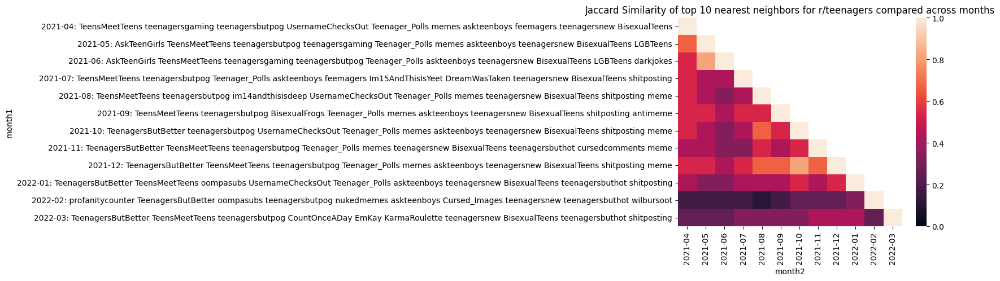

10 nearest neightbors of r/LeopardsAteMyFace


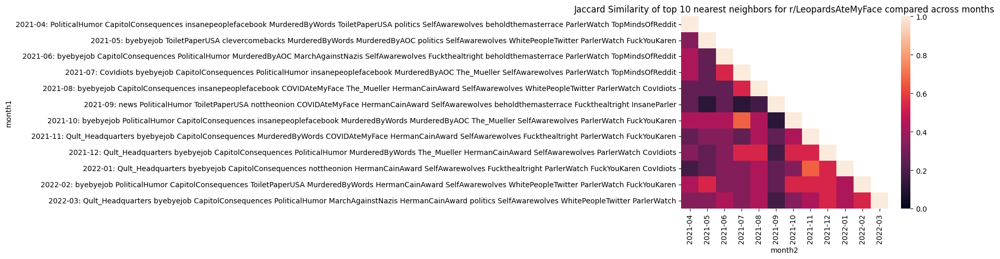

10 nearest neightbors of r/GME


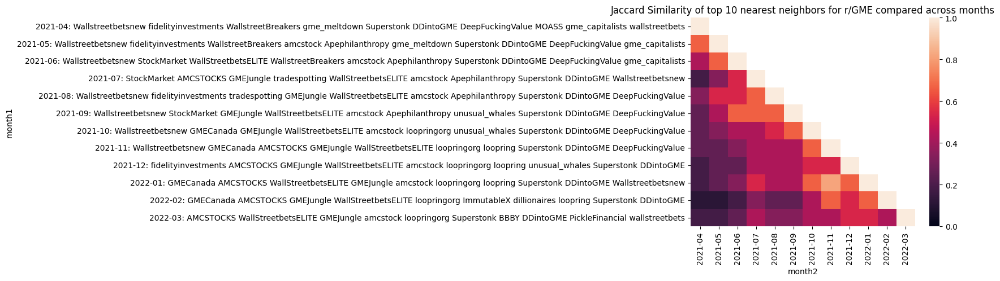

20 nearest neightbors of r/trans


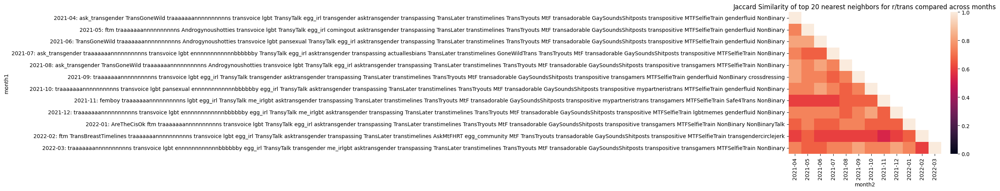

20 nearest neightbors of r/antiwork


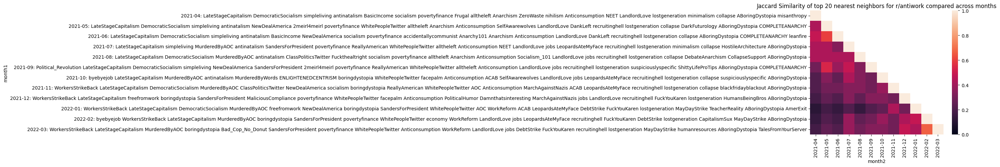

20 nearest neightbors of r/WorkReform


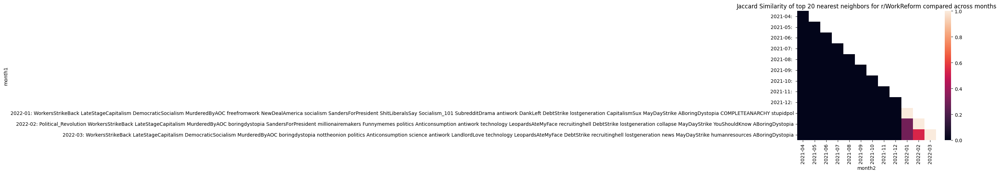

20 nearest neightbors of r/AskReddit


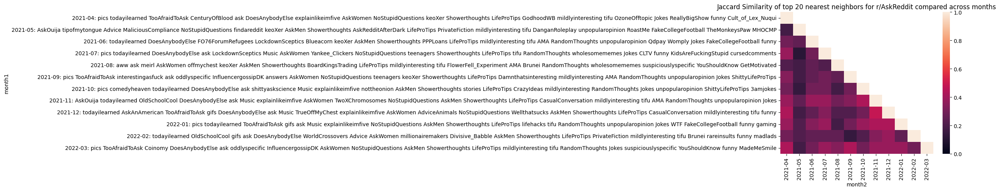

20 nearest neightbors of r/IdiotsInCars


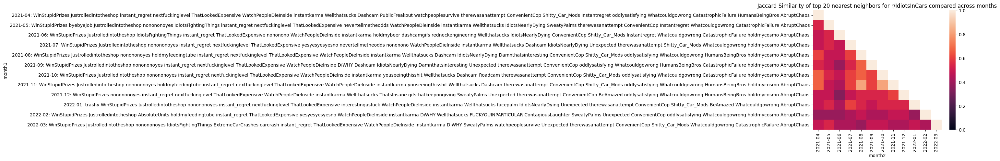

20 nearest neightbors of r/wallstreetbets


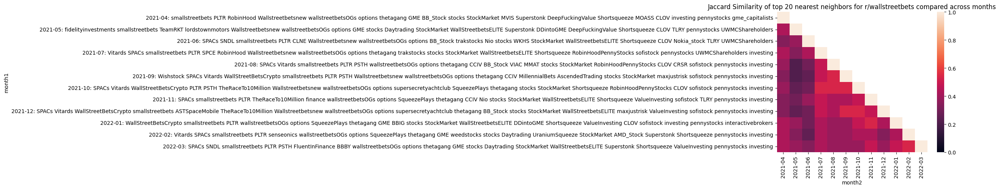

20 nearest neightbors of r/vaxxhappened


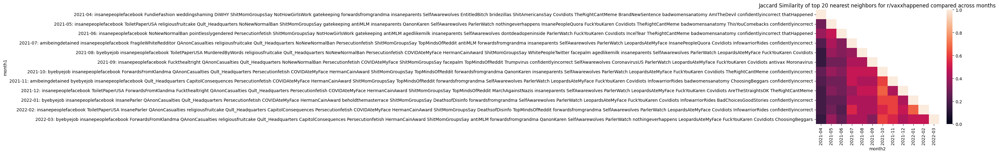

20 nearest neightbors of r/PublicFreakout


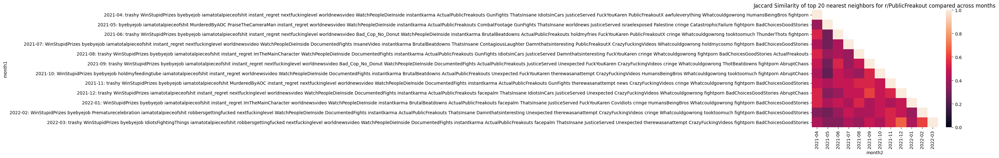

20 nearest neightbors of r/ActualPublicFreakouts


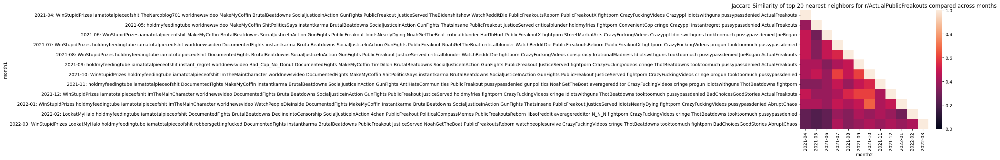

20 nearest neightbors of r/TheRedPill


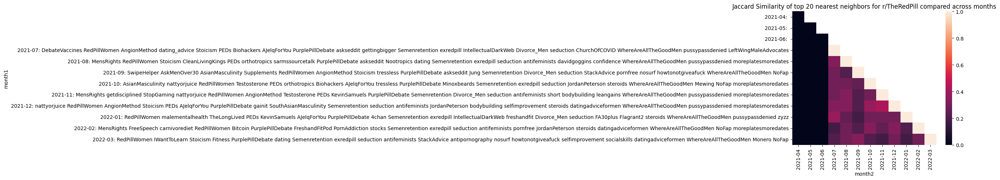

20 nearest neightbors of r/dating_advice


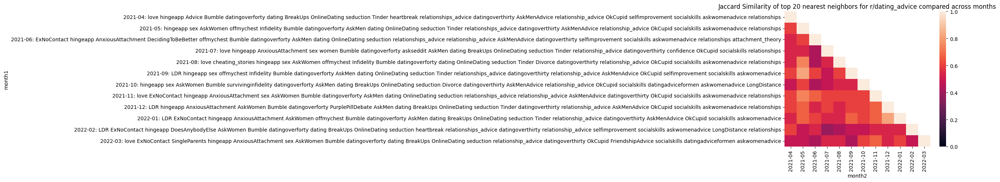

20 nearest neightbors of r/democrats


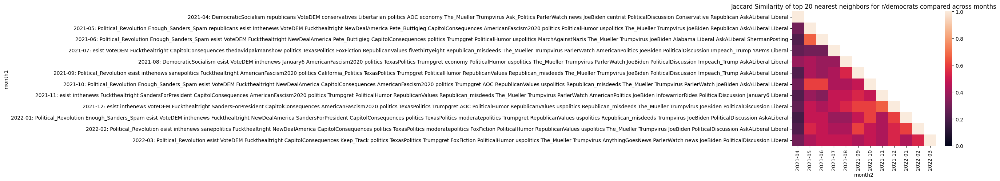

20 nearest neightbors of r/Conservative


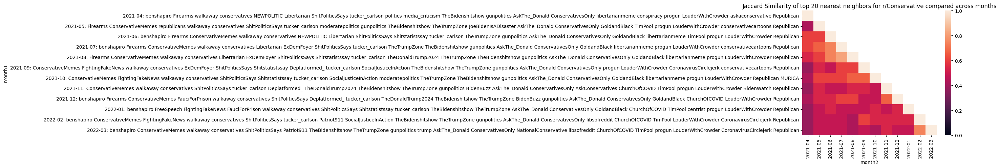

20 nearest neightbors of r/conservatives


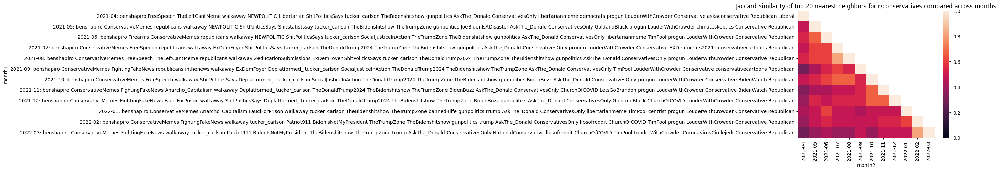

20 nearest neightbors of r/AskThe_Donald


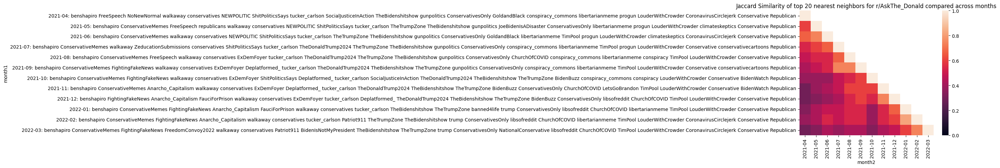

20 nearest neightbors of r/running


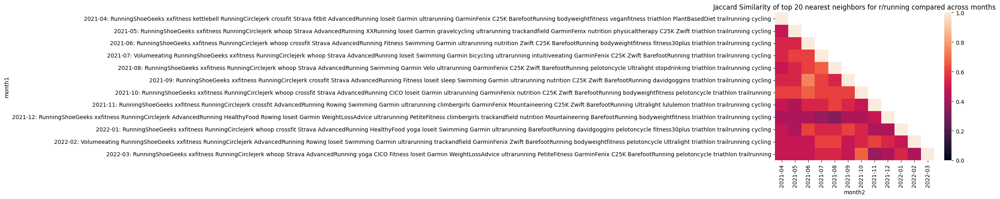

20 nearest neightbors of r/teenagers


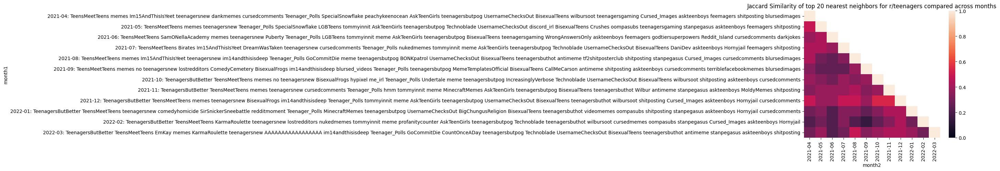

20 nearest neightbors of r/LeopardsAteMyFace


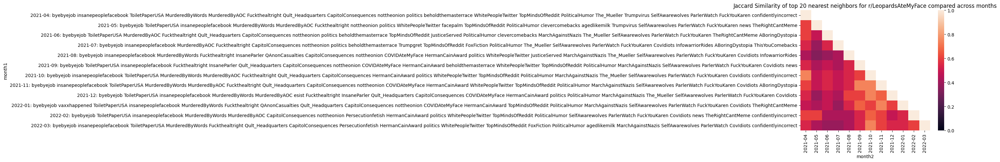

20 nearest neightbors of r/GME


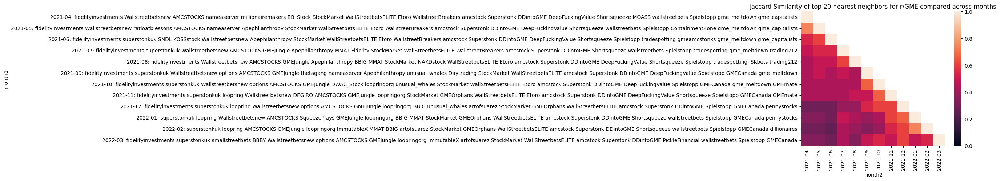

30 nearest neightbors of r/trans


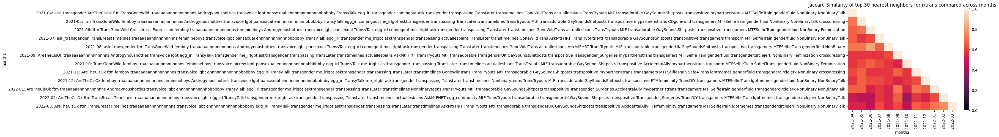

30 nearest neightbors of r/antiwork


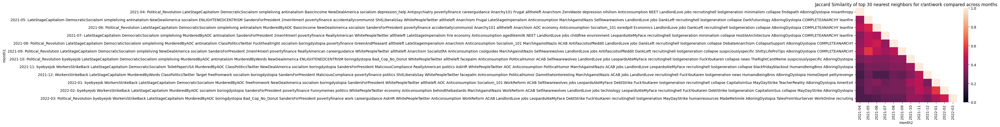

30 nearest neightbors of r/WorkReform


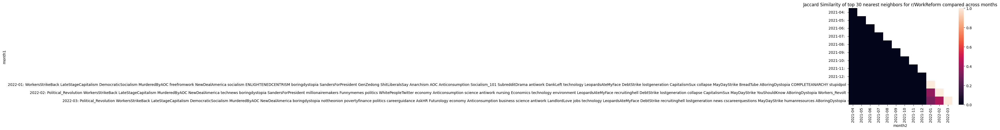

30 nearest neightbors of r/AskReddit


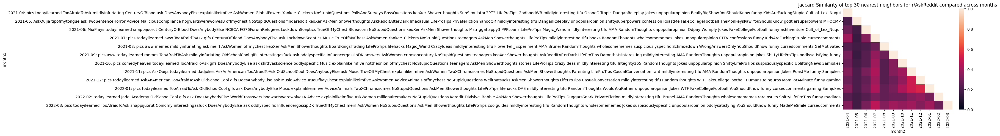

30 nearest neightbors of r/IdiotsInCars


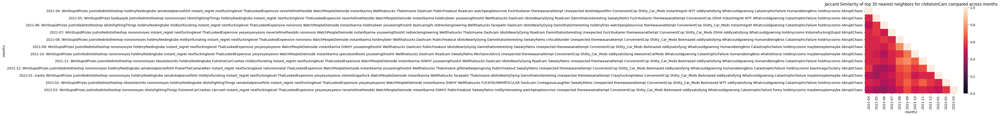

30 nearest neightbors of r/wallstreetbets


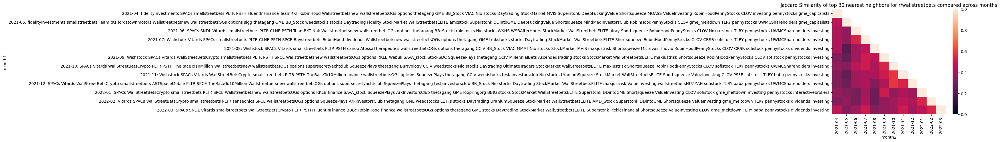

30 nearest neightbors of r/vaxxhappened


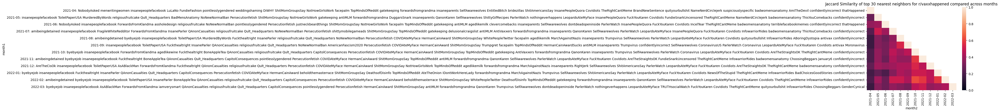

30 nearest neightbors of r/PublicFreakout


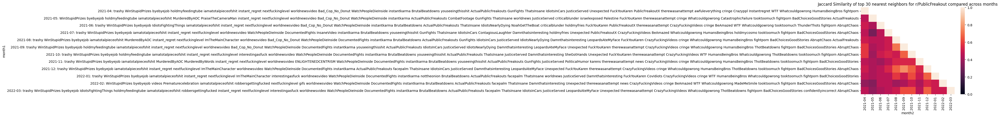

30 nearest neightbors of r/ActualPublicFreakouts


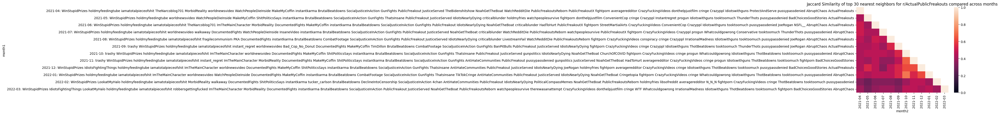

30 nearest neightbors of r/TheRedPill


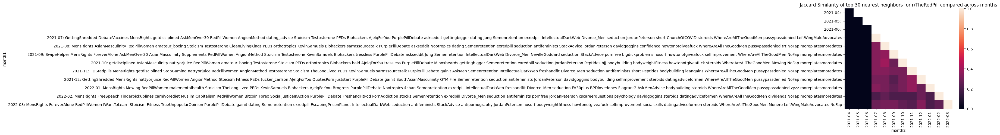

30 nearest neightbors of r/dating_advice


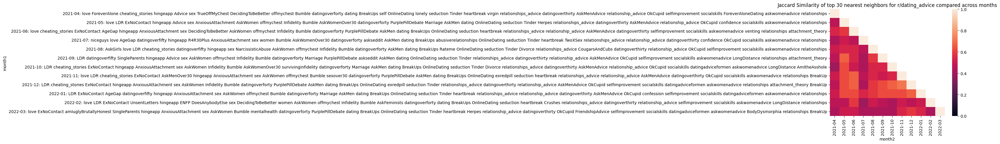

30 nearest neightbors of r/democrats


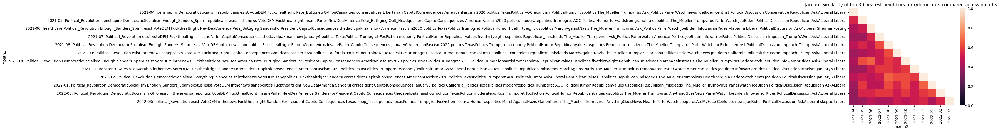

30 nearest neightbors of r/Conservative


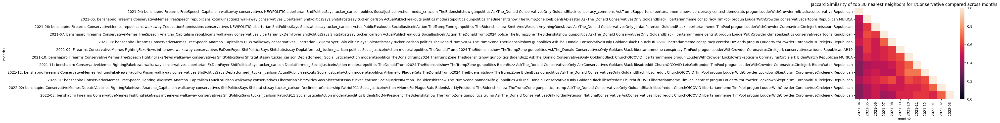

30 nearest neightbors of r/conservatives


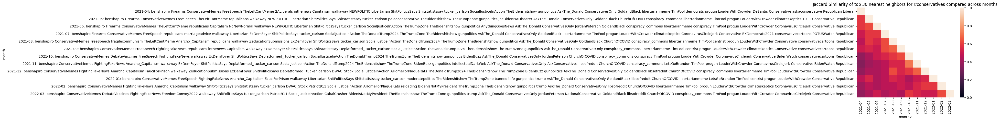

30 nearest neightbors of r/AskThe_Donald


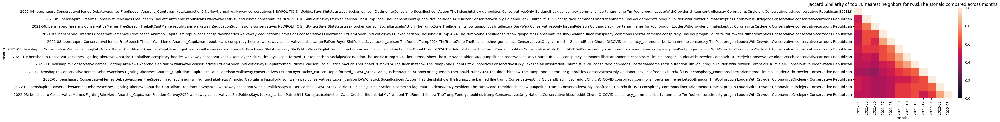

30 nearest neightbors of r/running


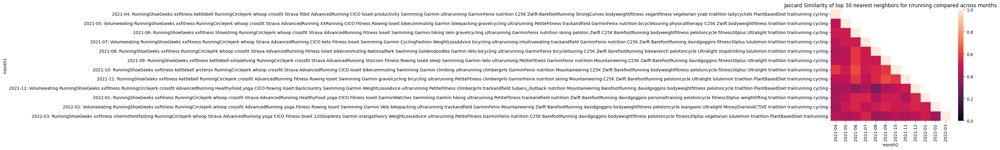

30 nearest neightbors of r/teenagers


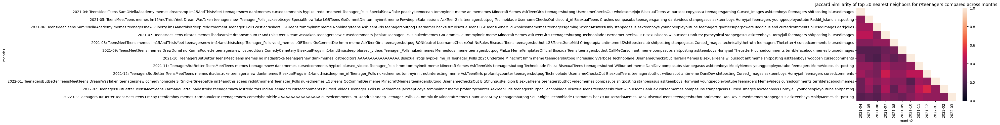

30 nearest neightbors of r/LeopardsAteMyFace


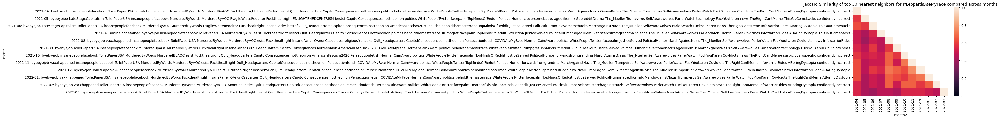

30 nearest neightbors of r/GME


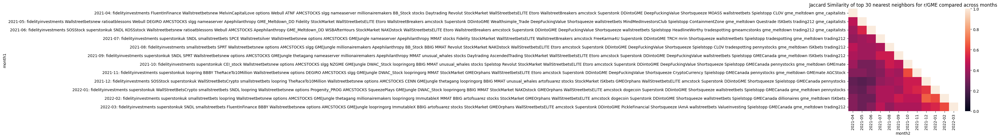

<Figure size 640x480 with 0 Axes>

In [ ]:


# Let's look at some specific subreddits
interesting_subreddits = ["trans", "antiwork", "WorkReform", "AskReddit", "IdiotsInCars", "wallstreetbets", "vaxxhappened", "PublicFreakout", "ActualPublicFreakouts", "TheRedPill", "dating_advice", "democrats", "Conservative", "conservatives", "AskThe_Donald", "running", "teenagers", "LeopardsAteMyFace", "GME"]


for n in [10, 20, 30]:
    for subreddit in interesting_subreddits:
        subreddit_comp_results = list()
        print(f"{n} nearest neighbors of r/{subreddit}")
        tick_labels = list()
        for i, month1_label in enumerate(MONTHS):
            c2v_model = C2V_MODELS[i]
            topn_nn = set(c2v_model.get_nearest_neighbors(subreddit, n))
            subreddit_comp_results.append((month1_label, topn_nn))
            tick_labels.append(month1_label + ": " + " ".join(topn_nn))

        subreddit_comp_df = pd.DataFrame.from_records(subreddit_comp_results, columns=["month1", "month1_subreddits"])
        subreddit_comp_df_right = subreddit_comp_df.copy().rename(columns={"month1": "month2", "month1_subreddits": "month2_subreddits"})
        merged = pd.merge(subreddit_comp_df, subreddit_comp_df_right, how="cross")
        
        merged["jaccard_similarity"] = merged.apply(lambda x: get_jaccard_similarity(x["month1_subreddits"], x["month2_subreddits"]), axis=1)
        pivot_table = merged.pivot(index = "month1", columns = "month2", values = "jaccard_similarity")
        mask = np.triu(np.ones_like(pivot_table, dtype=bool), 1)
        heatmap = sns.heatmap(pivot_table, vmin=0, vmax=1, yticklabels= tick_labels, mask = mask, cmap="viridis").set_title(f"Jaccard Similarity of top {n} nearest neighbors for r/{subreddit} compared across months")
        fig = heatmap.get_figure()
        plt.show()
        fig.savefig(VIZ_PATH / f"{n}_{subreddit}.png", bbox_inches="tight")
        plt.clf()


        